IMPORTATION DES PACKAGES

In [9]:
import glob
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import os
from random import randint
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import random
import easyocr as eo
import imutils as iu
import cv2
from matplotlib import pyplot as plt
import numpy as np

CHARGEMNET DES DONNEES

In [10]:
plaque = 'train'
image_size = (224, 224)  # plus raisonnable

images = []

for filename in os.listdir(plaque):
    if filename.lower().endswith(('.jpg', '.jpeg', '.png')):
        path = os.path.join(plaque, filename)
        try:
            img = Image.open(path).convert('RGB')
            img = img.resize(image_size)
            img_array = np.array(img, dtype=np.float32) / 255.0  # Normalisé et plus léger
            images.append(img_array)
        except Exception as e:
            print(f"Erreur avec {filename} : {e}")

images = np.array(images)

print("Nombre d'images chargées :", len(images))
print("Taille de chaque image :", images[0].shape)


Nombre d'images chargées : 5622
Taille de chaque image : (224, 224, 3)


VISUALISATION DES DONNEES 

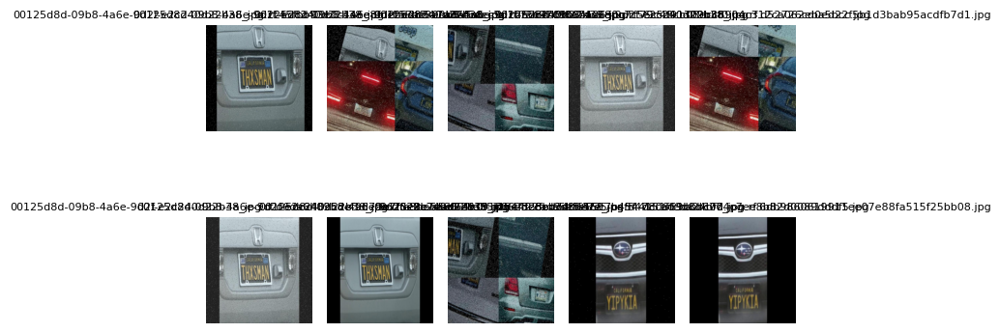

In [11]:
# Récupérer les fichiers image valides
image_files = [f for f in os.listdir(plaque_folder) if f.lower().endswith(valid_extensions)]

# Limiter à 10 images
image_files = image_files[:10]

# Affichage des 10 images originales
for i, file in enumerate(image_files):
    image_path = os.path.join(plaque_folder, file)
    img = cv2.imread(image_path)
    
    if img is None:
        print(f"Erreur de chargement : {file}")
        continue

    # Convertir de BGR (OpenCV) à RGB (Matplotlib)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 5, i + 1)  # 2 lignes, 5 colonnes
    plt.imshow(img_rgb)
    plt.title(f"{file}", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()


TRAITEMENT DES DONNEES 

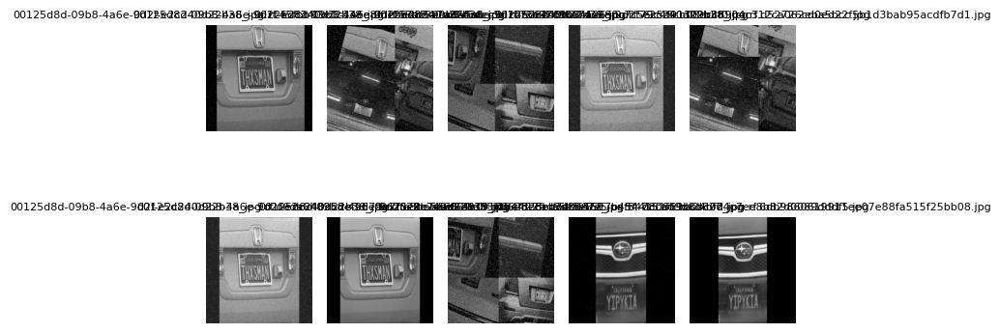

In [12]:
# Récupérer les fichiers image valides
image_files = [f for f in os.listdir(plaque_folder) if f.lower().endswith(valid_extensions)]

# Limiter à 10 images
image_files = image_files[:10]

# Affichage des 10 images
for i, file in enumerate(image_files):
    image_path = os.path.join(plaque_folder, file)
    img = cv2.imread(image_path)
    
    if img is None:
        print(f"Erreur de chargement : {file}")
        continue

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    plt.subplot(2, 5, i + 1)  # 2 lignes, 5 colonnes
    plt.imshow(gray, cmap='gray')
    plt.title(f"{file}", fontsize=8)
    plt.axis('off')

plt.tight_layout()
plt.show()

In [13]:
features = []
targets = []

plaque_dir = '../MEMOIRE/train'
# Créer la liste des fichiers images
plaque = [os.path.join(plaque_dir, f) for f in os.listdir(plaque_dir) if f.endswith(('.jpg', '.png', '.jpeg'))]

# Exemple : boucle pour une classe
for file in plaque:
    try:
        image = Image.open(file).resize((75, 75))
        features.append(np.array(image))
        targets.append([1, 0])  # classe 1
    except Exception as e:
        print(f"Erreur avec {file} : {e}")

# Pour une autre classe, il faut un autre dossier ou autre liste
# plaque_2 = ['dossier2/img1.jpg', ...]
# for file in plaque_2:
#     ...

# Conversion
features = np.array(features)
targets = np.array(targets)

print("features shape:", features.shape)
print("targets shape:", targets.shape)


features shape: (5622, 75, 75, 3)
targets shape: (5622, 2)


VISUALLISATION DES DONNEES

In [14]:
print("Nombre total d'échantillons :", len(features))

Nombre total d'échantillons : 5622


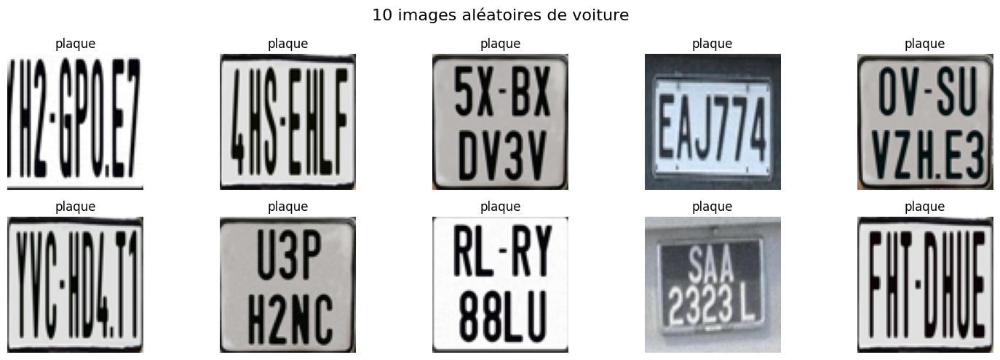

In [15]:
# 10 indices aléatoires
indices = random.sample(range(len(features)), 10)

plt.figure(figsize=(15, 5))

for i, idx in enumerate(indices):
    img = features[idx]
    label = targets[idx]

    # Décodage du label
    label_text = "plaque" if np.array_equal(label, [1, 0]) else "voiture"

    # Affichage
    plt.subplot(2, 5, i + 1)
    plt.imshow(img.astype('uint8'))  # Affiche l'image
    plt.title(label_text)
    plt.axis('off')

plt.suptitle("10 images aléatoires de voiture", fontsize=16)
plt.tight_layout()
plt.show()

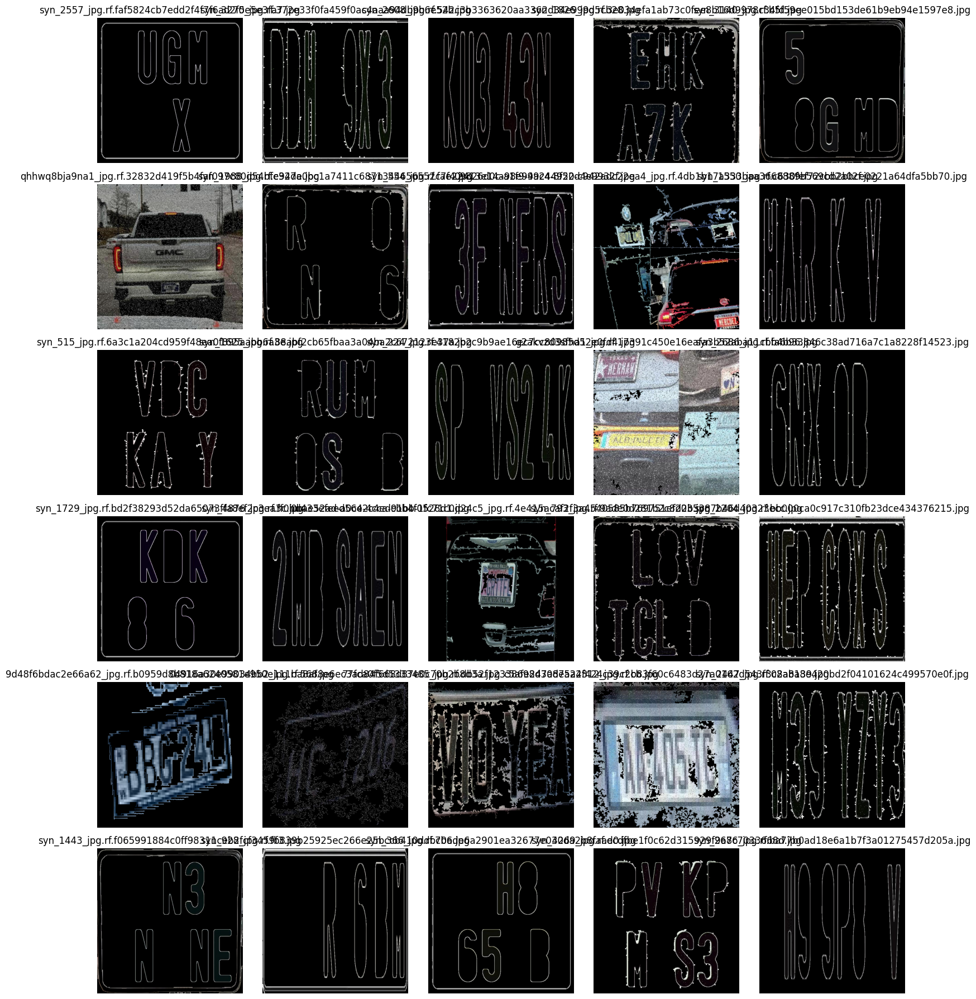

In [29]:
import os
import random  # Ajout pour la sélection aléatoire

# Chemin du dossier contenant les images
dataset_path = '../MEMOIRE/train'

# Récupérer la liste des fichiers images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Sélectionner 30 images aléatoires (limité au nombre total si < 30)
num_images = min(30, len(image_files))
random_image_files = random.sample(image_files, num_images)

# Calculer le nombre de lignes et colonnes pour afficher 30 images
cols = 5
rows = (num_images + cols - 1) // cols  # Ajuster dynamiquement les lignes
plt.figure(figsize=(15, 3 * rows))  # Ajuster la taille en fonction des lignes

for i, file in enumerate(random_image_files):
    image_path = os.path.join(dataset_path, file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"[ERREUR] Impossible de lire : {file}")
        continue

    # Convertir en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Réduction de bruit
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)

    # Détection des bords
    edged = cv2.Canny(bfilter, 30, 200)

    # Dilatation pour renforcer les contours
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edged, kernel, iterations=1)

    # Détection des contours
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]  # Prendre les 10 plus grands contours

    # Créer une copie de l'image originale pour dessiner les contours
    contour_image = image.copy()

    # Filtrer les contours pour détecter les quadrilatères (plaques)
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 3, True)
        if len(approx) == 4:  # Si c'est un quadrilatère
            cv2.drawContours(contour_image, [approx], -1, (0, 255, 0), 2)

    # Créer un masque
    mask = np.zeros_like(gray)
    cv2.drawContours(mask, contours, -1, 255, -1)
    masked_image = cv2.bitwise_and(image, image, mask=mask)

    # Afficher l'image masquée avec les contours
    plt.subplot(rows, cols, i + 1)
    plt.imshow(cv2.cvtColor(masked_image, cv2.COLOR_BGR2RGB))
    plt.title(file)
    plt.axis('off')

plt.tight_layout()
plt.show()

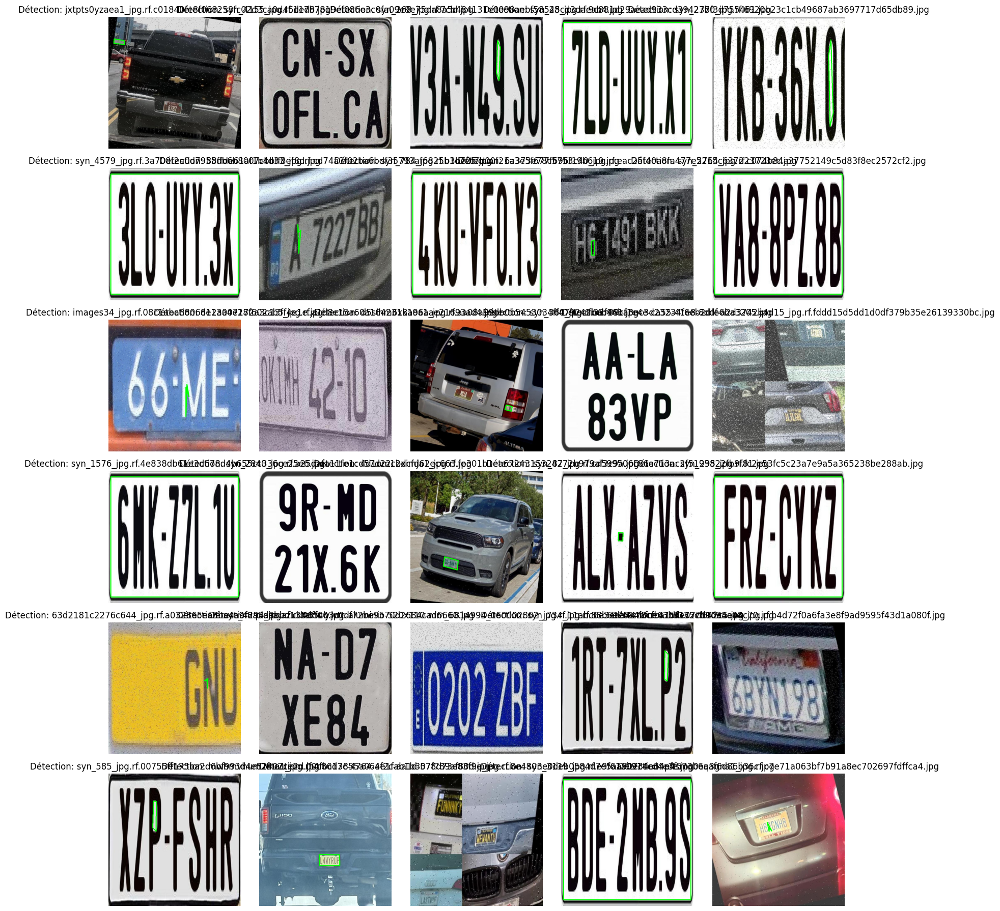

In [31]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random

# Chemins des dossiers
dataset_path = '../MEMOIRE/train'
output_path = '../MEMOIRE/plates_detected'
os.makedirs(output_path, exist_ok=True)

# Récupérer la liste des fichiers images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))]

# Sélectionner 30 images aléatoires (limité au nombre total si < 30)
num_images = min(30, len(image_files))
random_image_files = random.sample(image_files, num_images)

# Calculer le nombre de lignes et colonnes pour afficher 30 images
cols = 5
rows = (num_images + cols - 1) // cols  # Ajuster dynamiquement les lignes
plt.figure(figsize=(15, 3 * rows))  # Ajuster la taille en fonction des lignes

for i, file in enumerate(random_image_files):
    image_path = os.path.join(dataset_path, file)
    image = cv2.imread(image_path)

    if image is None:
        print(f"[ERREUR] Impossible de lire : {file}")
        continue

    # Étapes de prétraitement
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)
    edged = cv2.Canny(blurred, 30, 200)

    # Détection des contours
    contours, _ = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

    # Recherche du contour ayant 4 points
    location = None
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 10, True)
        if len(approx) == 4:
            location = approx
            break

    # Dessin du rectangle détecté (si trouvé)
    image_with_contour = image.copy()
    if location is not None:
        cv2.drawContours(image_with_contour, [location], -1, (0, 255, 0), 3)

    # Sauvegarde dans le dossier de sortie
    save_path = os.path.join(output_path, file)
    cv2.imwrite(save_path, image_with_contour)

    # Afficher l'image avec les contours dans une grille
    plt.subplot(rows, cols, i + 1)
    plt.imshow(cv2.cvtColor(image_with_contour, cv2.COLOR_BGR2RGB))
    plt.title(f'Détection: {file}')
    plt.axis('off')

plt.tight_layout()
plt.show()

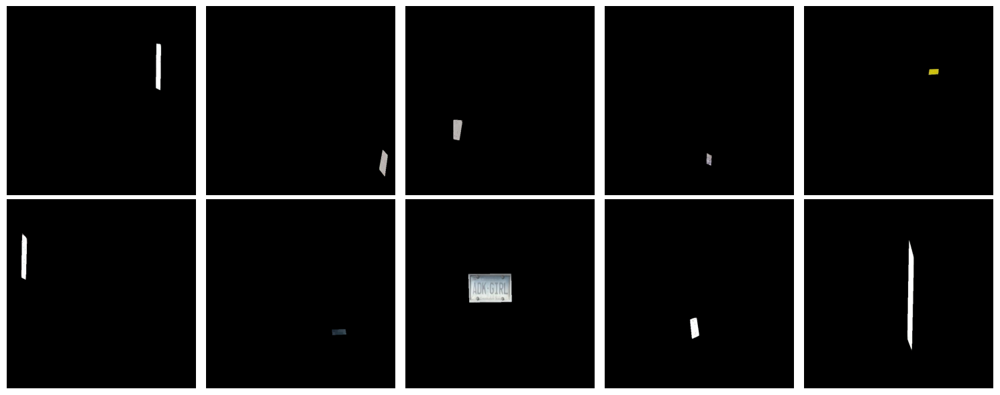

In [32]:


# Récupère les chemins d'images
image_files = [f for f in os.listdir(dataset_path) if f.endswith(('.jpg', '.jpeg', '.png'))]
random.shuffle(image_files)  # Mélange les images

# Stocke les images extraites
extracted_plates = []

# Parcours des images
for file in image_files:
    image_path = os.path.join(dataset_path, file)
    img = cv2.imread(image_path)
    
    if img is None:
        continue
    
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)  # Réduction de bruit
    edged = cv2.Canny(bfilter, 30, 200)              # Détection de contours

    # Trouver les contours
    keypoints = cv2.findContours(edged.copy(), cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = imutils.grab_contours(keypoints)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]

    location = None
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 10, True)
        if len(approx) == 4:
            location = approx
            break

    # Si plaque trouvée
    if location is not None:
        mask = np.zeros(gray.shape, np.uint8)
        new_image = cv2.drawContours(mask, [location], 0, 255, -1)
        new_image = cv2.bitwise_and(img, img, mask=mask)
        extracted_plates.append(new_image)
    
    # Stop après avoir collecté au moins 10 images
    if len(extracted_plates) >= 10:
        break

# Affichage
plt.figure(figsize=(15, 6))
for i in range(10):
    plt.subplot(2, 5, i+1)
    plt.imshow(cv2.cvtColor(extracted_plates[i], cv2.COLOR_BGR2RGB))
    plt.axis('off')
plt.tight_layout()
plt.show()


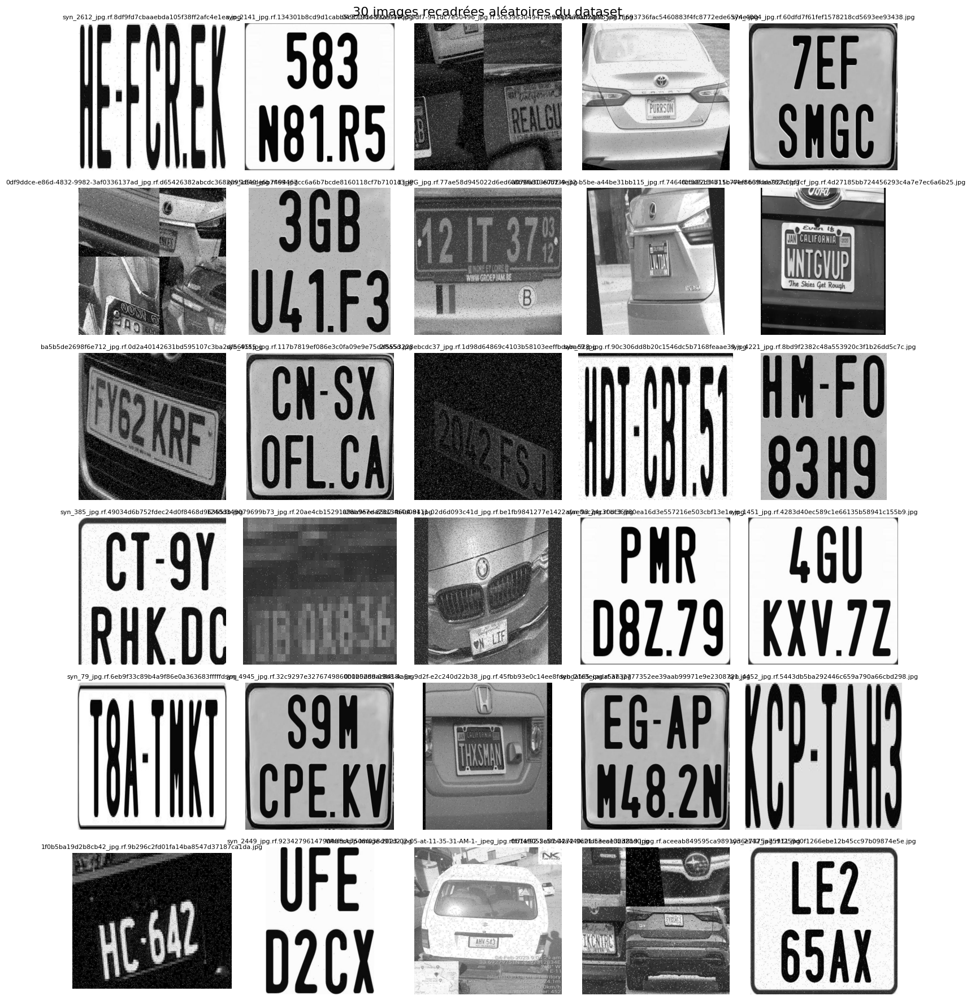

In [33]:

# Sélectionner 30 images aléatoires (limité au nombre total si < 30)
num_images = min(30, len(image_files))
random_image_files = random.sample(image_files, num_images)

# Calculer le nombre de lignes et colonnes pour afficher les images
cols = 5
rows = (num_images + cols - 1) // cols  # Ajuster dynamiquement les lignes
plt.figure(figsize=(15, 3 * rows))  # Ajuster la taille en fonction des lignes

# Affichage des images recadrées
for i, file in enumerate(random_image_files):
    image_path = os.path.join(dataset_path, file)
    image = cv2.imread(image_path)  # Charger l'image en BGR
    
    if image is None:
        print(f"Erreur de chargement : {file}")
        continue

    # Convertir en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Réduction de bruit
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)

    # Détection des bords
    edged = cv2.Canny(bfilter, 30, 200)

    # Dilatation pour renforcer les contours
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edged, kernel, iterations=1)

    # Détection des contours
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]  # Prendre les 10 plus grands contours

    # Créer un masque
    mask = np.zeros_like(gray)
    if contours:
        cv2.drawContours(mask, contours, -1, 255, -1)

    # Trouver les coordonnées des pixels où le masque est 255
    (x, y) = np.where(mask == 255)
    if len(x) > 0 and len(y) > 0:  # Vérifier qu'il y a des pixels détectés
        (x1, y1) = (np.min(x), np.min(y))
        (x2, y2) = (np.max(x), np.max(y))
        cropped_image = gray[x1:x2+1, y1:y2+1]
    else:
        cropped_image = gray  # Si aucun contour, utiliser l'image entière

    # Convertir de BGR à RGB (bien que cropped_image soit en niveaux de gris, on ajuste pour RGB si besoin)
    if len(cropped_image.shape) == 2:  # Si en niveaux de gris
        img_rgb = cv2.cvtColor(cv2.cvtColor(cropped_image, cv2.COLOR_GRAY2BGR), cv2.COLOR_BGR2RGB)
    else:
        img_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

    # Affichage
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(f"{file}", fontsize=8)
    plt.axis('off')

plt.suptitle("30 images recadrées aléatoires du dataset", fontsize=16)
plt.tight_layout()
plt.show()

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


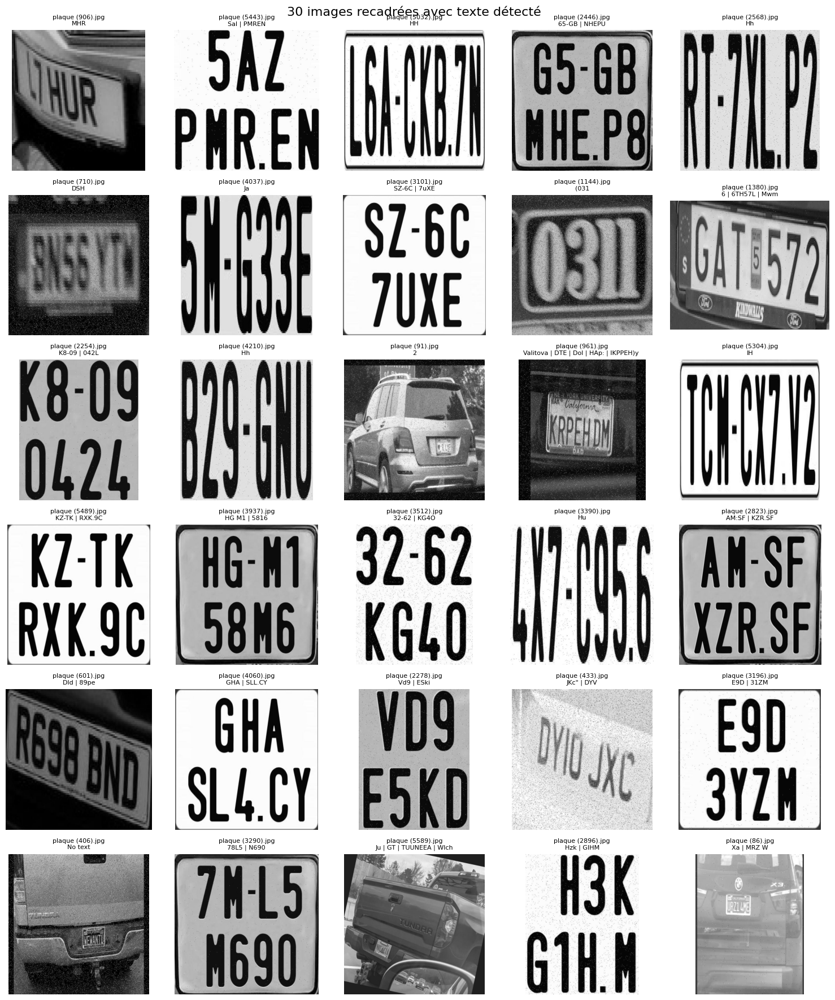

Image: plaque (906).jpg
Texte détecté : [([[63.01775119606775, 68.01419138394418], [483.90667119705427, 207.44716475495065], [382.98224880393224, 481.9858086160558], [-35.90667119705427, 342.5528352450493]], 'MHR', 0.8495468499500359)]
Image: plaque (5443).jpg
Texte détecté : [([[108, 0], [477, 0], [477, 261], [108, 261]], 'Sal', 0.2103017542945862), ([[0, 291], [580, 291], [580, 561], [0, 561]], 'PMREN', 0.6098864452267915)]
Image: plaque (5032).jpg
Texte détecté : [([[0, 14], [640, 14], [640, 619], [0, 619]], 'HH', 0.09815878452703135)]
Image: plaque (2446).jpg
Texte détecté : [([[71, 37], [597, 37], [597, 315], [71, 315]], '65-GB', 0.7759512424144835), ([[27, 325], [640, 325], [640, 630], [27, 630]], 'NHEPU', 0.3086364116607322)]
Image: plaque (2568).jpg
Texte détecté : [([[0, 0], [549, 0], [549, 553], [0, 553]], 'Hh', 0.5601729936526989)]
Image: plaque (710).jpg
Texte détecté : [([[65, 144], [632, 144], [632, 437], [65, 437]], 'DSH', 0.13288748356025074)]
Image: plaque (4037).jpg
T

In [36]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
import random
import easyocr

# Initialiser le lecteur easyocr pour l'anglais
reader = easyocr.Reader(['en'])

# Chemin du dossier contenant les images
dataset_path = '../MEMOIRE/train'# Remplacez par le chemin réel de votre dataset

# Récupérer la liste des fichiers images
image_files = [f for f in os.listdir(dataset_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Sélectionner 30 images aléatoires (limité au nombre total si < 30)
num_images = min(30, len(image_files))
random_image_files = random.sample(image_files, num_images)

# Calculer le nombre de lignes et colonnes pour afficher les images
cols = 5
rows = (num_images + cols - 1) // cols  # Ajuster dynamiquement les lignes
plt.figure(figsize=(15, 3 * rows))  # Ajuster la taille en fonction des lignes

# Affichage et traitement des images
for i, file in enumerate(random_image_files):
    image_path = os.path.join(dataset_path, file)
    image = cv2.imread(image_path)  # Charger l'image en BGR
    
    if image is None:
        print(f"Erreur de chargement : {file}")
        continue

    # Convertir en niveaux de gris
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Réduction de bruit
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)

    # Détection des bords
    edged = cv2.Canny(bfilter, 30, 200)

    # Dilatation pour renforcer les contours
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edged, kernel, iterations=1)

    # Détection des contours
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]  # Prendre les 10 plus grands contours

    # Créer un masque
    mask = np.zeros_like(gray)
    if contours:
        cv2.drawContours(mask, contours, -1, 255, -1)

    # Trouver les coordonnées des pixels où le masque est 255
    (x, y) = np.where(mask == 255)
    if len(x) > 0 and len(y) > 0:  # Vérifier qu'il y a des pixels détectés
        (x1, y1) = (np.min(x), np.min(y))
        (x2, y2) = (np.max(x), np.max(y))
        cropped_image = gray[x1:x2+1, y1:y2+1]
    else:
        cropped_image = gray  # Si aucun contour, utiliser l'image entière

    # Appliquer easyocr pour lire le texte
    result = reader.readtext(cropped_image)
    text_detected = "No text" if not result else " | ".join([item[1] for item in result])

    # Convertir l'image recadrée pour affichage (niveaux de gris à RGB)
    if len(cropped_image.shape) == 2:  # Si en niveaux de gris
        img_rgb = cv2.cvtColor(cv2.cvtColor(cropped_image, cv2.COLOR_GRAY2BGR), cv2.COLOR_BGR2RGB)
    else:
        img_rgb = cv2.cvtColor(cropped_image, cv2.COLOR_BGR2RGB)

    # Affichage
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(f"{file}\n{text_detected}", fontsize=8)
    plt.axis('off')

plt.suptitle("30 images recadrées avec texte détecté", fontsize=16)
plt.tight_layout()
plt.show()

# Afficher les résultats détaillés dans la console
for i, file in enumerate(random_image_files):
    print(f"Image: {file}")
    image_path = os.path.join(dataset_path, file)
    image = cv2.imread(image_path)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)
    edged = cv2.Canny(bfilter, 30, 200)
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edged, kernel, iterations=1)
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]
    mask = np.zeros_like(gray)
    if contours:
        cv2.drawContours(mask, contours, -1, 255, -1)
    (x, y) = np.where(mask == 255)
    if len(x) > 0 and len(y) > 0:
        (x1, y1) = (np.min(x), np.min(y))
        (x2, y2) = (np.max(x), np.max(y))
        cropped_image = gray[x1:x2+1, y1:y2+1]
    else:
        cropped_image = gray
    result = reader.readtext(cropped_image)
    print(f"Texte détecté : {result}")

Neither CUDA nor MPS are available - defaulting to CPU. Note: This module is much faster with a GPU.


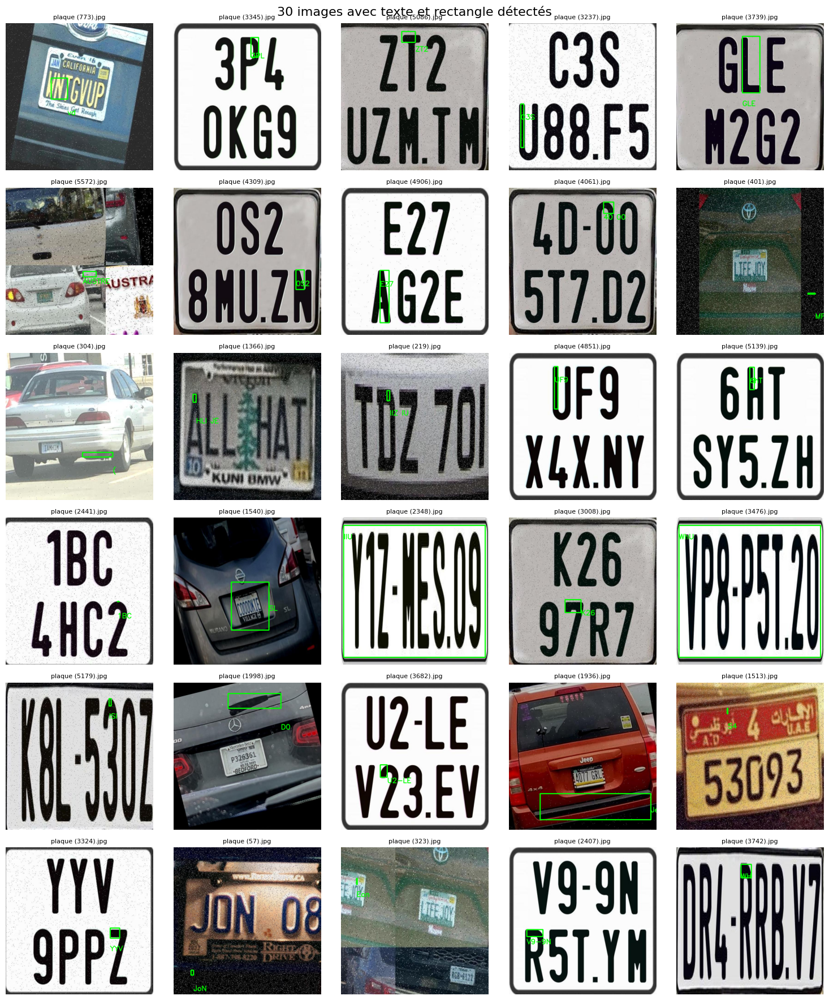

In [37]:

# Initialiser le lecteur easyocr pour l'anglais
reader = easyocr.Reader(['en'])

# Chemin du dossier contenant les images
dataset_path = '../MEMOIRE/train'  # Remplacez par le chemin réel de votre dataset

# Récupérer la liste des fichiers images
image_files = [f for f in os.listdir(dataset_path) if f.lower().endswith(('.jpg', '.jpeg', '.png'))]

# Sélectionner 30 images aléatoires (limité au nombre total si < 30)
num_images = min(30, len(image_files))
random_image_files = random.sample(image_files, num_images)

# Calculer le nombre de lignes et colonnes pour afficher les images
cols = 5
rows = (num_images + cols - 1) // cols  # Ajuster dynamiquement les lignes
plt.figure(figsize=(15, 3 * rows))  # Ajuster la taille en fonction des lignes

# Police pour le texte
font = cv2.FONT_HERSHEY_SIMPLEX

# Affichage et traitement des images
for i, file in enumerate(random_image_files):
    image_path = os.path.join(dataset_path, file)
    img = cv2.imread(image_path)  # Charger l'image en BGR
    
    if img is None:
        print(f"Erreur de chargement : {file}")
        continue

    # Convertir en niveaux de gris
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Réduction de bruit
    bfilter = cv2.bilateralFilter(gray, 11, 17, 17)

    # Détection des bords
    edged = cv2.Canny(bfilter, 30, 200)

    # Dilatation pour renforcer les contours
    kernel = np.ones((3, 3), np.uint8)
    dilated = cv2.dilate(edged, kernel, iterations=1)

    # Détection des contours
    contours, _ = cv2.findContours(dilated, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE)
    contours = sorted(contours, key=cv2.contourArea, reverse=True)[:10]  # Prendre les 10 plus grands contours

    # Vérifier s'il y a des contours
    approx = None
    for contour in contours:
        approx = cv2.approxPolyDP(contour, 10, True)
        if len(approx) == 4:  # Si c'est un quadrilatère
            break

    # Appliquer easyocr pour lire le texte
    result = reader.readtext(gray) if contours else []
    text = result[0][-2] if result else "No text"

    # Créer une copie de l'image pour les annotations
    res = img.copy()

    # Ajouter le texte si approx est défini
    if approx is not None and result:
        res = cv2.putText(res, text=text, org=(approx[0][0][0], approx[1][0][1] + 60), 
                          fontFace=font, fontScale=1, color=(0, 255, 0), thickness=2, lineType=cv2.LINE_AA)
        res = cv2.rectangle(res, tuple(approx[0][0]), tuple(approx[2][0]), (0, 255, 0), 3)

    # Convertir de BGR à RGB pour affichage
    img_rgb = cv2.cvtColor(res, cv2.COLOR_BGR2RGB)

    # Affichage
    plt.subplot(rows, cols, i + 1)
    plt.imshow(img_rgb)
    plt.title(f"{file}", fontsize=8)
    plt.axis('off')

plt.suptitle("30 images avec texte et rectangle détectés", fontsize=16)
plt.tight_layout()
plt.show()